In [1]:
import torch
import torch_geometric
import WAN
import numpy as np
import mat73
#import torch
from torch.nn.functional import normalize

import networkx as nx
from networkx import from_numpy_array
from torch_geometric.data import Data,Dataset
from torch_geometric.utils import from_networkx
import json
dataset = 'authorshipData.mat' # store the human paper
# here the aim is to convert the text into WAN

# the data: 
-----------------------------------------transferbility research--------------------------------------
- response: generated data only specify author
- response2: generated data specify author and topic 
- response3: data specify differnt author and topic from human  but in the same randomness
- response4: data in different author/topic in differnt ranomness
- response5: this data is useless, i just restric it on high randomness
----------------
## training data set
- response_title, use the selected author and titles the same as human_data


In [8]:
human_data = mat73.loadmat(dataset)
import pickle
with open("response_WANS",'rb') as f:
    (wordcounts,WANS)= pickle.load(f)
with open("response2_WANS.txt",'rb') as f:
    (val_wordcounts,val_WANS) =pickle.load(f)


with open("response3_WANS.txt",'rb') as f:
    val_wordcounts3, val_WANS3 = pickle.load(f)

with open("response4_WANS.txt",'rb') as f:
    val_wordcounts4, val_WANS4 = pickle.load(f)
with open("response5_WANS.txt",'rb') as f:
    val_wordcounts5, val_WANS5 = pickle.load(f)

In [7]:
function_words = [word[0] for word in human_data['function_words']]

In [9]:
def load_gpt(function_words,windowWidth,file = "responses.json",content_index = -1):
    gpt_response = file
    gpt_papers = []
    WANS = []
    
    wordcounts = []
    with open(gpt_response,'r') as f:
        count = 0
        while(True):
            response = f.readline().strip()
            if response:
                #print("an error ",dict(eval(response)))
                try:
                    gpt_papers.append(dict(eval(response)))
                except:
                    count+=1
                    print("an error ",count)
                
                    
            else:
                break
    print("valid dictionary",len(gpt_papers))
    for paper in gpt_papers:
        #paper = json.loads()
        
        papers = list(paper.items()) # all dictionary the last items is paper
        #print(papers)
        
        writer,novel = papers[content_index]
        #print(novel)
        
        #print(papers)
        #print(papers)
        
           
            
            
            # generate WAN for novel and store it in to gptWANs
        (text1Scores, text1Counts) = WAN.countFWs(WAN.cleanUp(novel),function_words,windowWidth)
        WAN1 = WAN.normalize(text1Scores) 
            
        WANS.append(WAN1)
        wordcounts.append(text1Counts)
    return wordcounts, WANS

In [10]:
train_wordcounts, train_WANS = load_gpt(function_words[:211],5,"responses_title.json") # training data


an error  1
an error  2
an error  3
valid dictionary 1146

Entering cleanUp()
Punctuation that will be removed: [',', '.', '!', '?', '"', ':', ';', ')', '(', '[', ']']
Text after punctuation and paragraphs processed:

Alexander the Great The Conqueror of the World

Alexander the Great was one of the most remarkable figures in the history of the world Born in 356 BC he was the son of King Philip II of Macedon and his wife Queen Olympia From a young age Alexander showed great promise as a leader and warrior and he was tutored by the famous philosopher Aristotle

When Alexander was just 20 years old his father was assassinated and he became king of Macedon He immediately set out to fulfill his father's dream of conquering the Persian Empire which was the most powerful empire in the world at that time

Alexander's military campaigns were legendary He led his army across the Hellespont and into Asia Minor where he defeated the Persian army at the Battle of Granicus He then marched south int

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



        Looking in window at word number 0 which is 'explore'
        Looking in window at word number 1 which is 'every'
        Looking in window at word number 2 which is 'inch'
        Looking in window at word number 3 which is 'of'
        Looking in window at word number 4 which is 'this'
        Looking in window at word number 0 which is 'inch'
        Looking in window at word number 1 which is 'of'
        Looking in window at word number 2 which is 'this'
        Looking in window at word number 3 which is 'magical'
        Looking in window at word number 4 which is 'land'
        Looking in window at word number 0 which is 'this'
        Looking in window at word number 1 which is 'magical'
        Looking in window at word number 2 which is 'land'
        Looking in window at word number 3 which is 'they'
        Looking in window at word number 4 which is 'climbed'
        Looking in window at word number 0 which is 'magical'
        Looking in window at word number 1 w

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




Output of normalize:
            [0.10473815461346633, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.09351620947630923, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0798004987531172, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1396508728179551, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2793017456359102, 0.0, 0.059850374064837904, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.10473815461346633, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




Output of normalize:
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.26455026455026454, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.07142857142857142, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5925925925925926, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.07142857142857142, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



        Looking in window at word number 3 which is 'of'
        Looking in window at word number 4 which is 'beauty'
        Looking in window at word number 0 which is 'life'
        Looking in window at word number 1 which is 'of'
        Looking in window at word number 2 which is 'beauty'
        Looking in window at word number 3 which is 'and'
        Looking in window at word number 4 which is 'excellence'
        Looking in window at word number 0 which is 'beauty'
        Looking in window at word number 1 which is 'and'
        Looking in window at word number 2 which is 'excellence'
        Looking in window at word number 0 which is 'excellence'
Entering normalize()

Output of normalize:
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.17964071856287425, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




Output of normalize:
            [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.22925457102672292, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0379746835443038, 0.0379746835443038, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3881856540084388, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1659634317862166, 0.0, 0.0, 0.090014064697609, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05063291139240506,

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



        Looking in window at word number 0 which is 'to'
        Looking in window at word number 1 which is 'bigger'
        Looking in window at word number 2 which is 'and'
        Looking in window at word number 3 which is 'better'
        Looking in window at word number 4 which is 'things'
        Looking in window at word number 0 which is 'bigger'
        Looking in window at word number 1 which is 'and'
        Looking in window at word number 2 which is 'better'
        Looking in window at word number 3 which is 'things'
        Looking in window at word number 4 which is 'or'
        Looking in window at word number 0 which is 'better'
        Looking in window at word number 1 which is 'things'
        Looking in window at word number 2 which is 'or'
        Looking in window at word number 3 which is 'had'
        Looking in window at word number 4 which is 'they'
        Looking in window at word number 0 which is 'had'
        Looking in window at word number 1 which i

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




            [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
            [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [11]:
def generate_graphs(wordcounts,WANS2):
    Graphs = []
    count=0
    for i in range(len(wordcounts)):
        adj_matrix = np.array(WANS2[i])
        #print(val_wordcounts,adj_matrix)
        try:
            graph = from_numpy_array(adj_matrix,create_using=nx.DiGraph)

            data = from_networkx(graph)
            
            edge_index = data.edge_index
            edge_attr = data.weight
            signal = torch.tensor(wordcounts[i],dtype =torch.float64 )

            signal = (signal-signal.mean())/(signal.std())

            g = Data(x = signal.reshape(-1,1), edge_index = edge_index,edge_attr = edge_attr,y = torch.tensor([[0]])) # i define chat gpt's label as zero
            Graphs.append(g)
        except:
            count+=1
            print(data)
            print(count)
            
    return Graphs

In [15]:
train_Graphs = generate_graphs(train_wordcounts,train_WANS)

In [16]:
for i in range(len(human_data["all_authors"])):
    print(human_data["all_authors"][i])
    author_excerpts = torch.tensor(human_data["all_wans"][i])
    
    num_papers = author_excerpts.shape[-1]
    for num in range(92):#num_papers): # keep balanced num between true/false samples
        adj_matrix = author_excerpts[:,:,num]
        signal = human_data["all_freqs"][i][:,num].reshape(-1,1)
        signal = torch.tensor(signal,dtype=torch.float64)
        signal = (signal-signal.mean())/(signal.std())
        y = torch.tensor([[1]])
        adj_matrix = np.array(adj_matrix)
        
        adj_matrix /= (adj_matrix.sum(axis = 1).reshape(-1,1)+0.0000001)
        graph = from_numpy_array(adj_matrix,create_using=nx.DiGraph)
       
        data = from_networkx(graph)
        edge_index = data.edge_index
        edge_attr = data.weight
        g = Data(x = signal, edge_index = edge_index,edge_attr = edge_attr,y = y) # i define chat gpt's label as zero
        train_Graphs.append(g)

['abbott']
['stevenson']
['alcott']
['alger']
['allen']
['austen']
['bronte']
['cooper']
['dickens']
['garland']
['hawthorne']
['james']
['melville']
['page']
['thoreau']
['twain']
['doyle']
['irving']
['poe']
['jewett']
['wharton']


In [17]:
with open("graph_dataset_response_title.txt",'wb') as f:
    pickle.dump(train_Graphs,f)
with open("graph_dataset_response_title.txt",'rb') as f:
    train_Graphs = pickle.load(f)

In [18]:
from torch_geometric.loader import DataLoader
from sklearn.model_selection import train_test_split
train_test = train_test_split(train_Graphs,train_size = 0.7,test_size = 0.3, shuffle=True)
print(len(train_Graphs),train_Graphs[12])
train_loader = DataLoader(train_test[0],batch_size = 128)
test_loader =  DataLoader(train_test[1],batch_size = 128)

3078 Data(x=[211, 1], edge_index=[2, 156], edge_attr=[156], y=[1, 1])


In [46]:
from torch.nn import Module,Linear,ReLU,Dropout,Sigmoid,ModuleList
from torch.nn.functional import tanh
from torch_geometric.nn import GCNConv
class GCNN(Module):
    def __init__(self,in_channel,hidden_channels,out_channel,dropout_rate,resize_num =211 ):
        super().__init__()
        self.convs = []
        
        prev_channels = in_channel
        for channel in hidden_channels:
            self.convs.append(GCNConv(prev_channels,channel))
            prev_channels = channel
        self.convs = torch.nn.ModuleList(self.convs)
        self.linear = Linear(prev_channels*resize_num,out_channel)
        self.relu = ReLU()
        self.dropout = Dropout(dropout_rate)
        self.sigmoid = Sigmoid()
        self.tanh = tanh
        
    def forward(self,x,edge_index,edge_attr,batch_size = 128):
        #print(x.reshape(batch_size,-1))
        for i, conv in enumerate(self.convs):
            
            
            x = conv(x,edge_index,edge_attr)
            x = self.dropout(x)
            if i != len(self.convs)-1:
                x = self.relu(x)
        #print(x.reshape(batch_size,-1))
        x = x.reshape(batch_size,-1)
        #print(x)
        #x = self.tanh(x)
        x = self.linear(x)
        x = self.sigmoid(x)
        #print(x)
        
        
        return x

            
            
model = GCNN(1,[16,1],1,0.3)

In [47]:
loss = torch.nn.BCELoss()

optimizer = torch.optim.Adam(model.parameters(),lr = 0.001)
def train(model,criteria,optimizer,epoch,train_loader,test,test_loader):
    train_accs = []
    test_accs = []
    for i in range(epoch):
        losses = 0
        total_count = 0
        accs = 0
        for batch in train_loader:
            #print(batch)
            optimizer.zero_grad()
            x = batch.x
            
            edge_index = batch.edge_index
            edge_attr = batch.edge_attr
            batch_size  = batch.y.shape[0]
            #print(batch_size)
            prediction = model.forward(x.float(),edge_index,edge_attr,batch.y.shape[0]).float()
            
            #print(prediction)
            
            
            loss = criteria(prediction,batch.y.float())
            loss.backward()
            optimizer.step()
            #accs = test(model,test_loader)
            losses+=loss
            total_count+=1
            
            prediction = prediction > 0.5
            
            
            accs += (prediction == batch.y).sum()/prediction.shape[0]
            
        test_acc = test(model,test_loader)    
        print("epoch ",i," is ",loss/total_count," accs is ", accs/total_count)#," test acc ",accs)
        train_accs.append(accs/total_count)
        test_accs.append(test_acc)
    return train_accs, test_accs

def test(model,test_loader):
    total_count = 0
    accs = 0
    for batch in test_loader:
        x = batch.x
        edge_index = batch.edge_index
        edge_attr = batch.edge_attr
        #print(batch)
        prediction = model.forward(x.float(),edge_index,edge_attr,batch.y.shape[0]).float()
        total_count+=1    
        prediction = prediction > 0.5            
        accs += (prediction == batch.y).sum()/prediction.shape[0]
    #print("test  accs is ", accs/total_count)#," test acc ",accs)
    return accs/total_count
    
train_accs, test_accs = train(model,loss,optimizer,200,train_loader,test,test_loader)  

epoch  0  is  tensor(0.0393, grad_fn=<DivBackward0>)  accs is  tensor(0.6159)
epoch  1  is  tensor(0.0387, grad_fn=<DivBackward0>)  accs is  tensor(0.6297)
epoch  2  is  tensor(0.0365, grad_fn=<DivBackward0>)  accs is  tensor(0.6297)
epoch  3  is  tensor(0.0342, grad_fn=<DivBackward0>)  accs is  tensor(0.6394)
epoch  4  is  tensor(0.0311, grad_fn=<DivBackward0>)  accs is  tensor(0.7019)
epoch  5  is  tensor(0.0264, grad_fn=<DivBackward0>)  accs is  tensor(0.8201)
epoch  6  is  tensor(0.0223, grad_fn=<DivBackward0>)  accs is  tensor(0.9002)
epoch  7  is  tensor(0.0179, grad_fn=<DivBackward0>)  accs is  tensor(0.9345)
epoch  8  is  tensor(0.0152, grad_fn=<DivBackward0>)  accs is  tensor(0.9595)
epoch  9  is  tensor(0.0126, grad_fn=<DivBackward0>)  accs is  tensor(0.9688)
epoch  10  is  tensor(0.0104, grad_fn=<DivBackward0>)  accs is  tensor(0.9726)
epoch  11  is  tensor(0.0106, grad_fn=<DivBackward0>)  accs is  tensor(0.9771)
epoch  12  is  tensor(0.0081, grad_fn=<DivBackward0>)  accs is

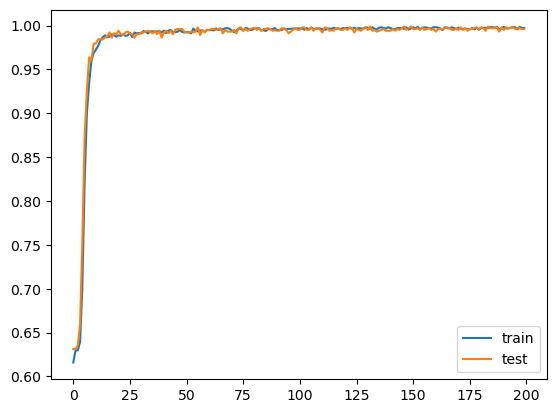

In [48]:
import matplotlib.pyplot as plt
plt.plot(train_accs,label = "train")
plt.plot(test_accs,'-',label = "test")
plt.legend()
plt.show()

In [49]:
torch.save(model.state_dict(), './model.pth')

In [50]:
from torch_geometric.explain import Explainer, GNNExplainer
from torch_geometric.data import Batch

In [51]:
explainer = Explainer(
    model=model,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)


In [52]:

data = Batch.from_data_list(train_Graphs)

In [53]:
node_mask = np.empty((211,1))
count = 0

explanation = explainer(data.x.float(),data.edge_index,target = data.y,edge_attr = data.edge_attr,batch_size = data.y.shape[0])



In [54]:
node_mask = explanation.node_mask

In [55]:
node_mask = node_mask.reshape(211,-1)
print(node_mask.shape)
node_mask = node_mask.sum(axis=1)
print(node_mask.shape)

torch.Size([211, 3078])
torch.Size([211])


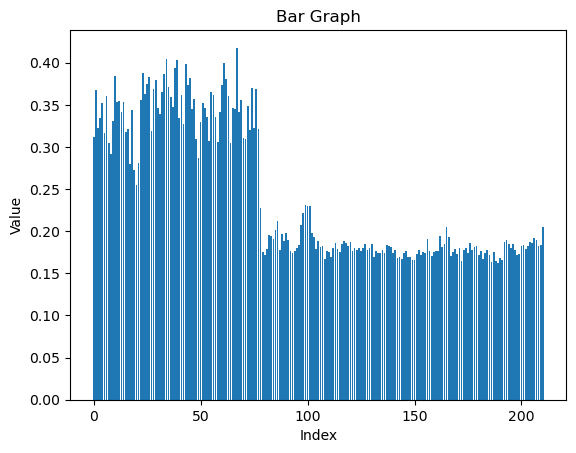

In [56]:
node_mask/=len(train_Graphs)
(node_mask-node_mask.min())/(node_mask.max()-node_mask.min())
x = np.arange(211)
plt.bar(x, node_mask)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

# try attention mechnisum

In [35]:
from torch_geometric.nn import ChebConv,GATConv
class GAT(Module):
    def __init__(self,in_channel,hidden_channels,out_channel,dropout_rate,resize_num =211 ):
        super().__init__()
        self.convs = []
        
        prev_channels = in_channel
        for channel in hidden_channels:
            self.convs.append(GATConv(prev_channels,channel,head = 2))
            prev_channels = channel
        self.convs = torch.nn.ModuleList(self.convs)
        self.linear = Linear(prev_channels*resize_num,out_channel)
        self.relu = ReLU()
        self.dropout = Dropout(dropout_rate)
        self.sigmoid = Sigmoid()
        self.tanh = tanh
        
    def forward(self,x,edge_index,edge_attr,batch_size = 128):
        #print(x.reshape(batch_size,-1))
        for i, conv in enumerate(self.convs):
            
            
            x = conv(x,edge_index,edge_attr)
            x = self.dropout(x)
            if i != len(self.convs)-1:
                x = self.relu(x)
        #print(x.reshape(batch_size,-1))
        x = x.reshape(batch_size,-1)
        #print(x)
        x = self.tanh(x)
        x = self.linear(x)
        x = self.sigmoid(x)
        #print(x)
        
        
        return x

loss = torch.nn.BCELoss()

       
            
model2 = GAT(1,[16,1],1,0.3)
optimizer = torch.optim.Adam(model2.parameters(),lr = 0.001)   
train_accs, test_accs = train(model2,loss,optimizer,200,train_loader,test,test_loader)

epoch  0  is  tensor(0.0364, grad_fn=<DivBackward0>)  accs is  tensor(0.6302)
epoch  1  is  tensor(0.0319, grad_fn=<DivBackward0>)  accs is  tensor(0.6375)
epoch  2  is  tensor(0.0248, grad_fn=<DivBackward0>)  accs is  tensor(0.7788)
epoch  3  is  tensor(0.0188, grad_fn=<DivBackward0>)  accs is  tensor(0.9632)
epoch  4  is  tensor(0.0151, grad_fn=<DivBackward0>)  accs is  tensor(0.9874)
epoch  5  is  tensor(0.0119, grad_fn=<DivBackward0>)  accs is  tensor(0.9908)
epoch  6  is  tensor(0.0087, grad_fn=<DivBackward0>)  accs is  tensor(0.9922)
epoch  7  is  tensor(0.0072, grad_fn=<DivBackward0>)  accs is  tensor(0.9922)
epoch  8  is  tensor(0.0071, grad_fn=<DivBackward0>)  accs is  tensor(0.9940)
epoch  9  is  tensor(0.0062, grad_fn=<DivBackward0>)  accs is  tensor(0.9940)
epoch  10  is  tensor(0.0053, grad_fn=<DivBackward0>)  accs is  tensor(0.9926)
epoch  11  is  tensor(0.0046, grad_fn=<DivBackward0>)  accs is  tensor(0.9945)
epoch  12  is  tensor(0.0038, grad_fn=<DivBackward0>)  accs is

In [38]:
torch.save(model2.state_dict(), './model2.pth')

In [43]:
data = Batch.from_data_list(train_Graphs)
explainer2 = Explainer(
    model=model2,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)





In [44]:
explanation2 = explainer2(data.x.float(),data.edge_index,target = data.y,edge_attr = data.edge_attr,batch_size = data.y.shape[0])
node_mask2 = explanation2.node_mask
node_mask2 = node_mask2.reshape(211,-1)
node_mask2 = node_mask2.sum(axis=1)/len(train_Graphs)
node_mask2

tensor([0.4234, 0.3985, 0.3997, 0.4082, 0.4092, 0.3982, 0.4250, 0.4269, 0.4109,
        0.3827, 0.3832, 0.3865, 0.3960, 0.4127, 0.3965, 0.3993, 0.3849, 0.4079,
        0.4061, 0.4078, 0.4197, 0.4199, 0.3860, 0.3792, 0.3932, 0.4190, 0.3918,
        0.4107, 0.3919, 0.3719, 0.3634, 0.3310, 0.3709, 0.3640, 0.3873, 0.4163,
        0.4029, 0.4102, 0.3999, 0.3951, 0.3776, 0.3954, 0.4009, 0.3830, 0.3632,
        0.3661, 0.3685, 0.3520, 0.4217, 0.4304, 0.3998, 0.4135, 0.4110, 0.3806,
        0.3991, 0.4145, 0.3932, 0.3975, 0.3996, 0.4104, 0.3984, 0.3754, 0.3729,
        0.3694, 0.4067, 0.3817, 0.3571, 0.3621, 0.3899, 0.3882, 0.4077, 0.4255,
        0.4076, 0.4044, 0.3632, 0.3911, 0.3796, 0.4096, 0.2750, 0.0672, 0.1007,
        0.0908, 0.0922, 0.1058, 0.0980, 0.1277, 0.0759, 0.0479, 0.0743, 0.0804,
        0.1030, 0.0521, 0.0677, 0.0344, 0.0722, 0.1074, 0.1090, 0.1390, 0.1494,
        0.1491, 0.1488, 0.1489, 0.1133, 0.1136, 0.1396, 0.1084, 0.1096, 0.1175,
        0.0890, 0.0992, 0.0865, 0.0729, 

torch.Size([211])
['a', 'bit', 'couple', 'aboard', 'about', 'above', 'absent', 'according', 'accordingly', 'across', 'after', 'against', 'ahead', 'albeit', 'all', 'along', 'alongside', 'although', 'amid', 'amidst', 'among', 'amongst', 'an', 'and', 'another', 'any', 'anybody', 'anyone', 'anything', 'around', 'as', 'aside', 'astraddle', 'astride', 'at', 'away', 'bar', 'barring', 'because', 'before', 'behind', 'below', 'beneath', 'beside', 'besides', 'between', 'beyond', 'both', 'but', 'by', 'can', 'certain', 'circa', 'close', 'concerning', 'consequently', 'considering', 'could', 'dare', 'despite', 'down', 'due', 'during', 'each', 'either', 'enough', 'every', 'everybody', 'everyone', 'everything', 'except', 'excluding', 'failing', 'few', 'fewer', 'following', 'for', 'from', 'given', 'heaps', 'hence', 'however', 'if', 'in', 'spite', 'view', 'including', 'inside', 'instead', 'into', 'it', 'its', 'itself', 'less', 'like', 'little', 'loads', 'lots', 'many', 'may', 'might', 'minus', 'more', 'm

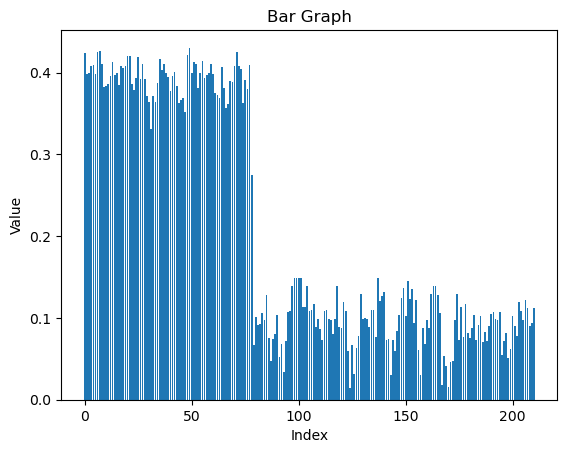

In [45]:
print(node_mask2.shape)
print(function_words)
node_maske2 = (node_mask2-node_mask2.min())/(node_mask2.max()-node_mask2.min())
x = np.arange(211)
plt.bar(x, node_mask2)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

In [58]:
with open("two_original_explanation",'wb') as f:
    pickle.dump((explanation,explanation2),f)

# test the transferbility of data:


In [59]:
####### first transferbility: the performance facing new generated chatgpt data######################
with open("response3_WANS.txt",'rb') as f:
    (val_wordcounts,val_WANS) =pickle.load(f)

In [60]:
            
def append_human_data(length,Graphs):
    for i in range(len(human_data["all_authors"])):
        print(human_data["all_authors"][i])
        author_excerpts = torch.tensor(human_data["all_wans"][i])

        num_papers = author_excerpts.shape[-1]
        for num in range(length):#num_papers): # keep balanced num between true/false samples
            adj_matrix = author_excerpts[:,:,num]
            signal = human_data["all_freqs"][i][:,num].reshape(-1,1)
            signal = torch.tensor(signal,dtype=torch.float64)
            signal = (signal-signal.mean())/(signal.std())
            y = torch.tensor([[1]])
            adj_matrix = np.array(adj_matrix)

            adj_matrix /= (adj_matrix.sum(axis = 1).reshape(-1,1)+0.0000001)
            graph = from_numpy_array(adj_matrix,create_using=nx.DiGraph)

            data = from_networkx(graph)
            edge_index = data.edge_index
            edge_attr = data.weight
            g = Data(x = signal, edge_index = edge_index,edge_attr = edge_attr,y = y) # i define chat gpt's label as zero
            Graphs.append(g)
    return Graphs   
def generate_graphs(wordcounts,WANS2,index = 0):
    Graphs = []
    count=0
    for i in range(len(wordcounts)):
        adj_matrix = np.array(WANS2[i])
        #print(val_wordcounts,adj_matrix)
        try:
            graph = from_numpy_array(adj_matrix,create_using=nx.DiGraph)

            data = from_networkx(graph)
            
            edge_index = data.edge_index
            edge_attr = data.weight
            signal = torch.tensor(wordcounts[i],dtype =torch.float64 )

            signal = (signal-signal.mean())/(signal.std())

            g = Data(x = signal.reshape(-1,1), edge_index = edge_index,edge_attr = edge_attr,y = torch.tensor([[index]])) # i define chat gpt's label as zero
            Graphs.append(g)
        except:
            count+=1
            print(data)
            print(count)
            
    return Graphs

In [67]:
val_graphs =  generate_graphs(val_wordcounts,val_WANS,index = 0)
print(len(val_graphs))
#val_graphs = append_human_data(33,val_graphs)

626


# raw we can clearly see the difference between two models on unseen chat gpt data

In [68]:
val_loader = DataLoader(val_graphs,batch_size = 128)
test(model,val_loader)

tensor(0.6767)

In [69]:
test(model2,val_loader)


tensor(0.7325)

# new human text with original chatgpt data

In [70]:

with open("poem_graphs_long.txt",'rb') as f:
    poem_graphs_long = pickle.load(f)
    print(len(poem_graphs_long))

187


In [71]:
val2_graphs_long = poem_graphs_long#+train_Graphs
val2_loader_long = DataLoader(val2_graphs_long,batch_size =64)

In [72]:
print(test(model,val2_loader_long))
print(test(model2,val2_loader_long))

tensor(0.7682)
tensor(0.9635)


In [73]:
with open("poem_graphs.txt",'rb') as f:
    poem_graphs = pickle.load(f)
    print(len(poem_graphs))

889


In [74]:
train_Graphs = generate_graphs(train_wordcounts,train_WANS)


In [75]:
val2_graphs = poem_graphs#+train_Graphs
val2_loader = DataLoader(val2_graphs,batch_size = 128)

In [76]:
print(test(model,val2_loader))
print(test(model2,val2_loader))

tensor(0.0926)
tensor(0.1264)


In [77]:
len(train_Graphs)

1146

# conclusion: 
## it is hard to identify human data
## main reason maybe the gener of original data has not seen poem
## gat performs better

In [78]:
val_data = Batch.from_data_list(poem_graphs)
val_data2 = Batch.from_data_list(val_graphs)
val_data3 = Batch.from_data_list(poem_graphs_long)


In [79]:
explainer = Explainer(
    model=model,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation3_1 = explainer(val_data.x.float(),val_data.edge_index,target = val_data.y,edge_attr = val_data.edge_attr,batch_size = val_data.y.shape[0])




torch.Size([211, 889])
torch.Size([211])


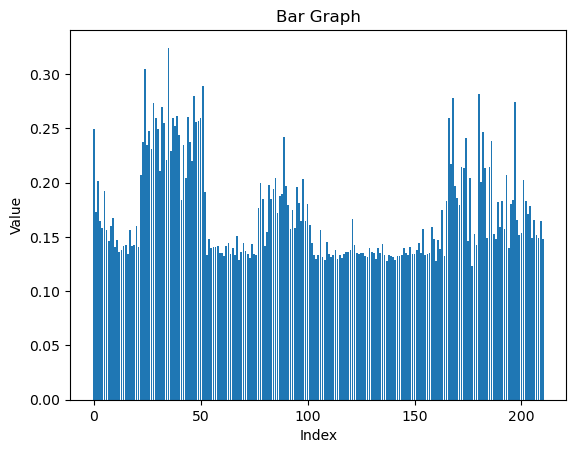

In [80]:
node_mask = explanation3_1.node_mask
node_mask = node_mask.reshape(211,-1)
print(node_mask.shape)
node_mask = node_mask.sum(axis=1)
print(node_mask.shape)
node_mask/=len(train_Graphs)
(node_mask-node_mask.min())/(node_mask.max()-node_mask.min())
x = np.arange(211)
plt.bar(x, node_mask)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

torch.Size([211, 626])
torch.Size([211])


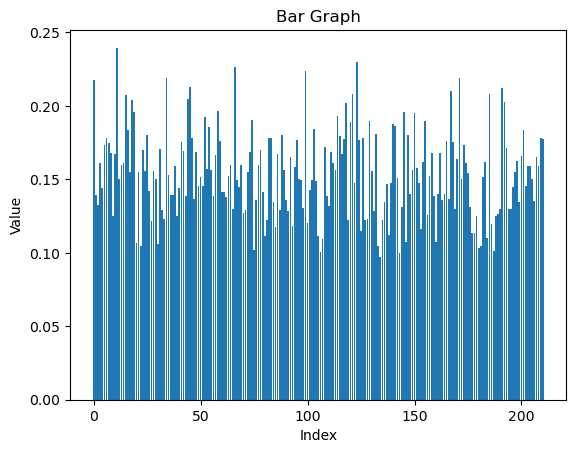

In [81]:
explainer = Explainer(
    model=model,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation3_2 = explainer(val_data2.x.float(),val_data2.edge_index,target = val_data2.y,edge_attr = val_data2.edge_attr,batch_size = val_data2.y.shape[0])
node_mask = explanation3_2.node_mask
node_mask = node_mask.reshape(211,-1)
print(node_mask.shape)
node_mask = node_mask.sum(axis=1)
print(node_mask.shape)
node_mask/=len(train_Graphs)
(node_mask-node_mask.min())/(node_mask.max()-node_mask.min())
x = np.arange(211)
plt.bar(x, node_mask)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()



torch.Size([211, 187])
torch.Size([211])


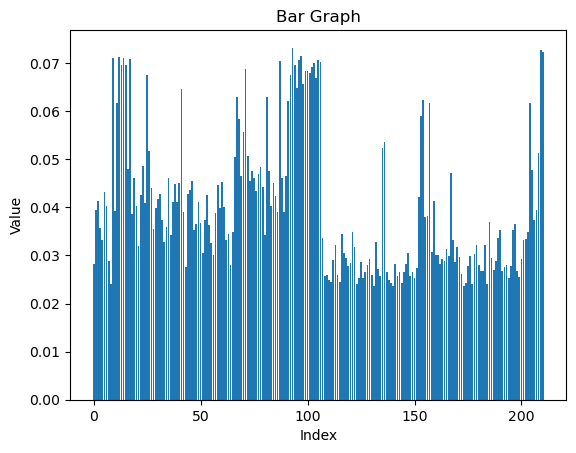

In [82]:
explainer = Explainer(
    model=model,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation3_3 = explainer(val_data3.x.float(),val_data3.edge_index,target = val_data3.y,edge_attr = val_data3.edge_attr,batch_size = val_data3.y.shape[0])
node_mask = explanation3_3.node_mask
node_mask = node_mask.reshape(211,-1)
print(node_mask.shape)
node_mask = node_mask.sum(axis=1)
print(node_mask.shape)
node_mask/=len(train_Graphs)
(node_mask-node_mask.min())/(node_mask.max()-node_mask.min())
x = np.arange(211)
plt.bar(x, node_mask)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

In [83]:
with open("explanation_model_transfer.txt",'wb') as f:
    pickle.dump((explanation3_1,explanation3_2,explanation3_3),f)

## the explainer on two set of data on attention model

In [84]:
explainer2 = Explainer(
    model=model2,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation4_1 = explainer2(val_data.x.float(),val_data.edge_index,target = val_data.y,edge_attr = val_data.edge_attr,batch_size = val_data.y.shape[0])
node_mask2 = explanation4_1.node_mask

torch.Size([211])
['a', 'bit', 'couple', 'aboard', 'about', 'above', 'absent', 'according', 'accordingly', 'across', 'after', 'against', 'ahead', 'albeit', 'all', 'along', 'alongside', 'although', 'amid', 'amidst', 'among', 'amongst', 'an', 'and', 'another', 'any', 'anybody', 'anyone', 'anything', 'around', 'as', 'aside', 'astraddle', 'astride', 'at', 'away', 'bar', 'barring', 'because', 'before', 'behind', 'below', 'beneath', 'beside', 'besides', 'between', 'beyond', 'both', 'but', 'by', 'can', 'certain', 'circa', 'close', 'concerning', 'consequently', 'considering', 'could', 'dare', 'despite', 'down', 'due', 'during', 'each', 'either', 'enough', 'every', 'everybody', 'everyone', 'everything', 'except', 'excluding', 'failing', 'few', 'fewer', 'following', 'for', 'from', 'given', 'heaps', 'hence', 'however', 'if', 'in', 'spite', 'view', 'including', 'inside', 'instead', 'into', 'it', 'its', 'itself', 'less', 'like', 'little', 'loads', 'lots', 'many', 'may', 'might', 'minus', 'more', 'm

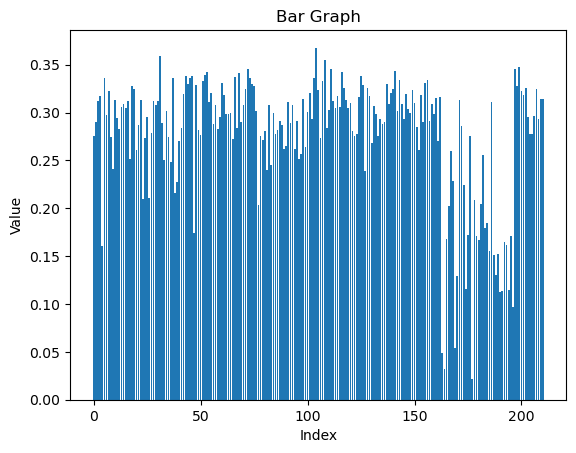

In [85]:

node_mask2 = node_mask2
node_mask2 = node_mask2.reshape(211,-1)
node_mask2 = node_mask2.sum(axis=1)/len(train_Graphs)
node_mask2
print(node_mask2.shape)
print(function_words)
node_maske2 = (node_mask2-node_mask2.min())/(node_mask2.max()-node_mask2.min())
x = np.arange(211)
plt.bar(x, node_mask2)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

In [86]:
explainer2 = Explainer(
    model=model2,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation4_2 = explainer2(val_data2.x.float(),val_data2.edge_index,target = val_data2.y,edge_attr = val_data2.edge_attr,batch_size = val_data2.y.shape[0])
node_mask2 = explanation4_2.node_mask

torch.Size([211])
['a', 'bit', 'couple', 'aboard', 'about', 'above', 'absent', 'according', 'accordingly', 'across', 'after', 'against', 'ahead', 'albeit', 'all', 'along', 'alongside', 'although', 'amid', 'amidst', 'among', 'amongst', 'an', 'and', 'another', 'any', 'anybody', 'anyone', 'anything', 'around', 'as', 'aside', 'astraddle', 'astride', 'at', 'away', 'bar', 'barring', 'because', 'before', 'behind', 'below', 'beneath', 'beside', 'besides', 'between', 'beyond', 'both', 'but', 'by', 'can', 'certain', 'circa', 'close', 'concerning', 'consequently', 'considering', 'could', 'dare', 'despite', 'down', 'due', 'during', 'each', 'either', 'enough', 'every', 'everybody', 'everyone', 'everything', 'except', 'excluding', 'failing', 'few', 'fewer', 'following', 'for', 'from', 'given', 'heaps', 'hence', 'however', 'if', 'in', 'spite', 'view', 'including', 'inside', 'instead', 'into', 'it', 'its', 'itself', 'less', 'like', 'little', 'loads', 'lots', 'many', 'may', 'might', 'minus', 'more', 'm

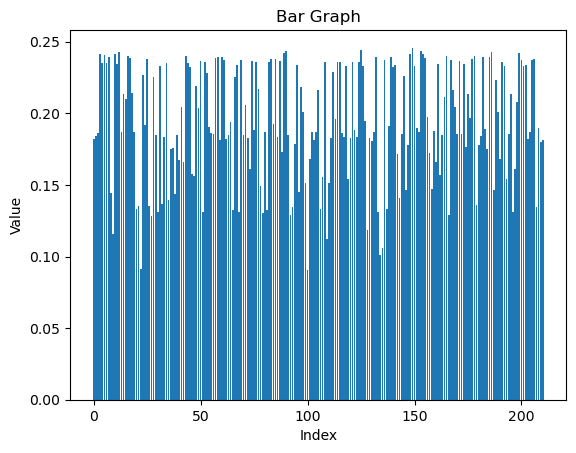

In [87]:
node_mask2 = node_mask2
node_mask2 = node_mask2.reshape(211,-1)
node_mask2 = node_mask2.sum(axis=1)/len(train_Graphs)
node_mask2
print(node_mask2.shape)
print(function_words)
node_maske2 = (node_mask2-node_mask2.min())/(node_mask2.max()-node_mask2.min())
x = np.arange(211)
plt.bar(x, node_mask2)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

torch.Size([211])
['a', 'bit', 'couple', 'aboard', 'about', 'above', 'absent', 'according', 'accordingly', 'across', 'after', 'against', 'ahead', 'albeit', 'all', 'along', 'alongside', 'although', 'amid', 'amidst', 'among', 'amongst', 'an', 'and', 'another', 'any', 'anybody', 'anyone', 'anything', 'around', 'as', 'aside', 'astraddle', 'astride', 'at', 'away', 'bar', 'barring', 'because', 'before', 'behind', 'below', 'beneath', 'beside', 'besides', 'between', 'beyond', 'both', 'but', 'by', 'can', 'certain', 'circa', 'close', 'concerning', 'consequently', 'considering', 'could', 'dare', 'despite', 'down', 'due', 'during', 'each', 'either', 'enough', 'every', 'everybody', 'everyone', 'everything', 'except', 'excluding', 'failing', 'few', 'fewer', 'following', 'for', 'from', 'given', 'heaps', 'hence', 'however', 'if', 'in', 'spite', 'view', 'including', 'inside', 'instead', 'into', 'it', 'its', 'itself', 'less', 'like', 'little', 'loads', 'lots', 'many', 'may', 'might', 'minus', 'more', 'm

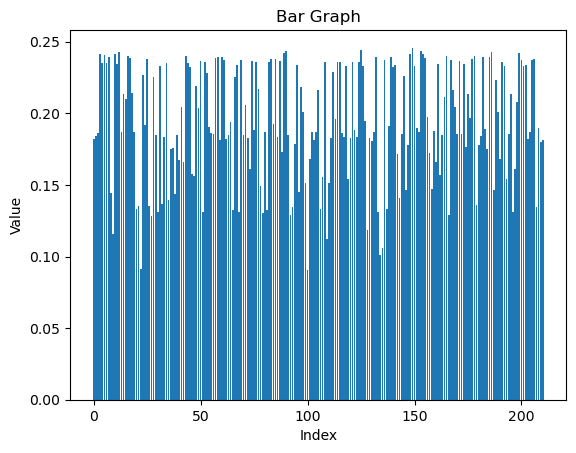

In [88]:
explainer2 = Explainer(
    model=model2,
    algorithm=GNNExplainer(epochs=200),
    explanation_type='model',
    node_mask_type="object",
    edge_mask_type="object",
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type="probs",
    ),
)
explanation4_3 = explainer2(val_data2.x.float(),val_data2.edge_index,target = val_data2.y,edge_attr = val_data2.edge_attr,batch_size = val_data2.y.shape[0])
node_mask2 = explanation4_2.node_mask
node_mask2 = node_mask2
node_mask2 = node_mask2.reshape(211,-1)
node_mask2 = node_mask2.sum(axis=1)/len(train_Graphs)
node_mask2
print(node_mask2.shape)
print(function_words)
node_maske2 = (node_mask2-node_mask2.min())/(node_mask2.max()-node_mask2.min())
x = np.arange(211)
plt.bar(x, node_mask2)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Bar Graph')

# Display the plot
plt.show()

In [89]:
with open("explanation_model2_transfer.txt",'wb') as f:
    pickle.dump((explanation4_1,explanation4_2,explanation4_3),f)

# another training method
- what if we trained on much more broader chatgpt geners
## data argumentation

In [116]:
with open("response5_WANS.txt",'rb') as f:
    (val_wordcounts2,val_WANS2) =pickle.load(f)
val_graphs3 =  generate_graphs(val_wordcounts2,val_WANS2,index = 0)
print(len(val_graphs3))
val_graphs3 = append_human_data(30,val_graphs3)
print(len(val_graphs3))

640
['abbott']
['stevenson']
['alcott']
['alger']
['allen']
['austen']
['bronte']
['cooper']
['dickens']
['garland']
['hawthorne']
['james']
['melville']
['page']
['thoreau']
['twain']
['doyle']
['irving']
['poe']
['jewett']
['wharton']
1270


In [117]:
val3_loader = DataLoader(val_graphs3,batch_size = 128) 

In [123]:
model2 = GAT(1,[16,1],1,0.3)
optimizer = torch.optim.Adam(model2.parameters(),lr = 0.001)   
train_accs, test_accs = train(model2,loss,optimizer,50,val3_loader,test,test_loader)

epoch  0  is  tensor(0.0909, grad_fn=<DivBackward0>)  accs is  tensor(0.3992)
epoch  1  is  tensor(0.0848, grad_fn=<DivBackward0>)  accs is  tensor(0.4792)
epoch  2  is  tensor(0.0777, grad_fn=<DivBackward0>)  accs is  tensor(0.4711)
epoch  3  is  tensor(0.0739, grad_fn=<DivBackward0>)  accs is  tensor(0.4803)
epoch  4  is  tensor(0.0705, grad_fn=<DivBackward0>)  accs is  tensor(0.5075)
epoch  5  is  tensor(0.0679, grad_fn=<DivBackward0>)  accs is  tensor(0.5149)
epoch  6  is  tensor(0.0668, grad_fn=<DivBackward0>)  accs is  tensor(0.5293)
epoch  7  is  tensor(0.0657, grad_fn=<DivBackward0>)  accs is  tensor(0.5472)
epoch  8  is  tensor(0.0645, grad_fn=<DivBackward0>)  accs is  tensor(0.5578)
epoch  9  is  tensor(0.0634, grad_fn=<DivBackward0>)  accs is  tensor(0.5753)
epoch  10  is  tensor(0.0618, grad_fn=<DivBackward0>)  accs is  tensor(0.5749)
epoch  11  is  tensor(0.0616, grad_fn=<DivBackward0>)  accs is  tensor(0.6170)
epoch  12  is  tensor(0.0599, grad_fn=<DivBackward0>)  accs is

In [122]:
model = GCNN(1,[16,1],1,0.3)
optimizer = torch.optim.Adam(model.parameters(),lr = 0.001)   
train_accs, test_accs = train(model,loss,optimizer,50,val3_loader,test,test_loader)

epoch  0  is  tensor(0.0731, grad_fn=<DivBackward0>)  accs is  tensor(0.4207)
epoch  1  is  tensor(0.0727, grad_fn=<DivBackward0>)  accs is  tensor(0.4904)
epoch  2  is  tensor(0.0721, grad_fn=<DivBackward0>)  accs is  tensor(0.5160)
epoch  3  is  tensor(0.0716, grad_fn=<DivBackward0>)  accs is  tensor(0.5440)
epoch  4  is  tensor(0.0705, grad_fn=<DivBackward0>)  accs is  tensor(0.5877)
epoch  5  is  tensor(0.0699, grad_fn=<DivBackward0>)  accs is  tensor(0.6105)
epoch  6  is  tensor(0.0684, grad_fn=<DivBackward0>)  accs is  tensor(0.6888)
epoch  7  is  tensor(0.0672, grad_fn=<DivBackward0>)  accs is  tensor(0.7376)
epoch  8  is  tensor(0.0650, grad_fn=<DivBackward0>)  accs is  tensor(0.7987)
epoch  9  is  tensor(0.0638, grad_fn=<DivBackward0>)  accs is  tensor(0.8159)
epoch  10  is  tensor(0.0623, grad_fn=<DivBackward0>)  accs is  tensor(0.8583)
epoch  11  is  tensor(0.0598, grad_fn=<DivBackward0>)  accs is  tensor(0.8821)
epoch  12  is  tensor(0.0552, grad_fn=<DivBackward0>)  accs is

In [124]:
val2_graphs = poem_graphs#+train_Graphs
val2_loader = DataLoader(val2_graphs,batch_size = 128)
test(model,val2_loader)

tensor(0.4423)

In [125]:
test(model2,val2_loader)

tensor(0.0912)

In [129]:
test(model2,train_loader)

tensor(0.9758)

In [128]:
test(model,train_loader)

tensor(0.9620)